## !! Hacer Test unitario, con la función más grande hacer un assert de lo que tiene que salir. Y hacer un benchmark.

In [163]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from gensim.models import Word2Vec
import spacy
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from joblib import load, dump

import tensorflow as tf

In [2]:
tqdm.pandas()

## Paths

In [171]:
data_sent_full         = '../Data/PREP/sentiment_full.parquet'
path_modelo_w2v        = '../Data/MODELS/modelo_word2vec_100.model'
path_modelo_clustering = '../Data/MODELS/clustering_pipeline.joblib'

# Dataset

In [10]:
data = pd.read_parquet(data_sent_full)
data = (
    data
    .reset_index()
    .rename(columns={'sentences':'phrase', 'page':'n_page', 'sentence':'n_phrase'},)
    .set_index(['bank','year', 'n_page', 'n_phrase'])
)

In [12]:
data

phrase  \
bank           year n_page n_phrase                                                      
ABBEY_NATIONAL 2003 1      1         Full Year Financial Results FebruaryFebruaryFe...   
                    2      28        Full Year Financial Results February February ...   
                           20         Summarised consolidated profit and loss account    
                           14         Personal Financial Services trading profit be...   
                           15         Portfolio Business Unit profit loss before ta...   
...                                                                                ...   
UNICREDIT      2021 840    14         VaR Value at Risk A measure of the risk of po...   
                           18        assets for a certain period of time until it r...   
                    843    1           Annual Report and Accounts Contacts UniCredit S   
                           2          Head Office in Milan P iazza Gae Aulenti Towe...   
                           3            Media Relations E mail mediarelationsunicredit   

                                     length  negative   neutral  positive  
bank           year n_page n_phrase                                        
ABBEY_NATIONAL 2003 1      1             18  0.000068  0.999884  0.000049  
                    2      28            53  0.000074  0.999874  0.000052  
                           20             6  0.000116  0.999831  0.000053  
                           14             9  0.000086  0.999869  0.000045  
                           15             9  0.997227  0.002284  0.000489  
...                                     ...       ...       ...       ...  
UNICREDIT      2021 840    14            31  0.102616  0.896958  0.000427  
                           18            20  0.000078  0.999863  0.000058  
                    843    1              7  0.000072  0.999887  0.000041  
                           2             11  0.000070  0.999874  0.000056  
                           3              5  0.000070  0.999884  0.000046  

[1202495 rows x 5 columns]

In [13]:
preview = data.sort_values(by='positive', ascending=False).head(20)[['phrase']]
# preview.to_html('preview_positive.html')

preview

phrase
bank           year n_page n_phrase                                                   
ABBEY_NATIONAL 2008 16     13         Global Banking Markets trading profit before ...
                    19     6          Global Banking Markets noninterest income inc...
               2007 15     31         Wealth Management net interest income increas...
               2008 19     14         Private Banking net interest income increased...
HSBC           2011 17     14         Outcome reported riskadjusted revenue increas...
BARCLAYS       2007 38     41        Net interest income grew Rm to Rm Rm driven by...
ABBEY_NATIONAL 2006 18     13         Wealth Management net interest income increas...
                           2          Financial Markets noninterest income increase...
DRESDNER       2005 73     19        from the IRUs nonstrategic business net intere...
HSBC           2014 105    40        addition revenue rose from increased net inter...
BARCLAYS       2000 16     38        Barclays Global Investors operating profit inc...
HSBC           2018 10     9          Global Banking and Markets grew adjusted reve...
               2011 33     14         Our share of profits from BoCom rose driven b...
BARCLAYS       2001 40     37        Financial review Introduction Introduction The...
INTESA         2001 64     7          In fact as of st December IntesaBci rose in t...
HSBC           2014 89     5          Elsewhere in Asia revenue in India rose by pr...
INTESA         2000 93     12         The Bank registered growth rates in overall f...
SANTANDER      2017 112    4          As regards business performance activity and ...
BARCLAYS       2005 110    16         Net trading income increased m to m m due to ...
NATWEST        2010 170    7          Key points Residential mortgages increased by...

# Evolución de Proporción de Positivos & Negativos

In [7]:
df_props = data.copy().reset_index()

In [8]:
PROPORCION_NEGATIVO = .5
PROPORCION_POSITIVO = .5

df_props['IS_NEG'] = np.where(df_props.negative > PROPORCION_NEGATIVO, 1, 0)
df_props['IS_POS'] = np.where(df_props.positive > PROPORCION_POSITIVO, 1, 0)
df_props['TOTAL']  = 1

In [9]:
df_props_counts = df_props.groupby(['bank','year']).sum()[['IS_NEG','IS_POS','TOTAL']]

In [10]:
df_props_counts['NEGATIVITY'] = df_props_counts['IS_NEG']/df_props_counts['TOTAL']
df_props_counts['POSITIVITY'] = df_props_counts['IS_POS']/df_props_counts['TOTAL']

df_props_counts.reset_index(inplace=True)
df_props_counts['year'] = df_props_counts['year'].astype('int')

<AxesSubplot:xlabel='year', ylabel='POSITIVITY'>

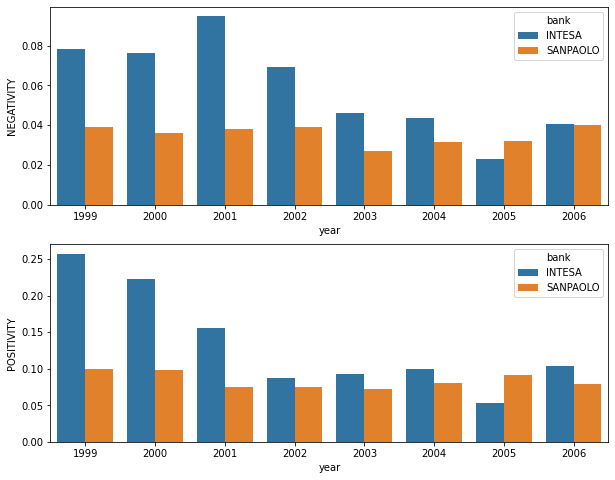

In [11]:
fig, ax = plt.subplots(figsize=(10,8), nrows=2)

df_i_s = df_props_counts[df_props_counts.bank.isin(['INTESA', 'SANPAOLO'])]
sns.barplot(x='year', y='NEGATIVITY', hue='bank', data=df_i_s, ax=ax[0])
sns.barplot(x='year', y='POSITIVITY', hue='bank', data=df_i_s, ax=ax[1])

<AxesSubplot:xlabel='year', ylabel='POSITIVITY'>

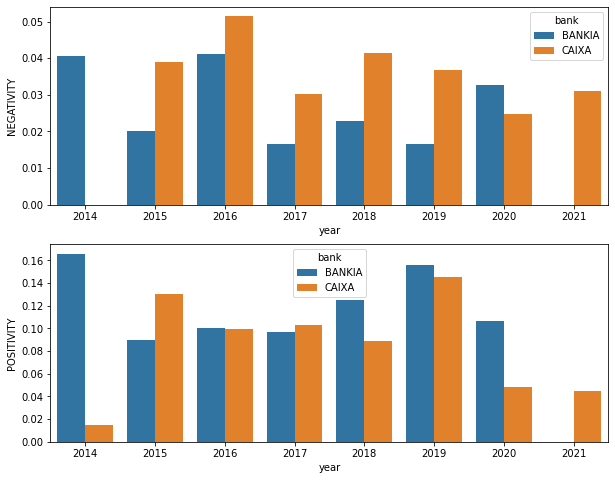

In [12]:
fig, ax = plt.subplots(figsize=(10,8), nrows=2)

df_i_s = df_props_counts[df_props_counts.bank.isin(['BANKIA', 'CAIXA'])]
sns.barplot(x='year', y='NEGATIVITY', hue='bank', data=df_i_s, ax=ax[0])
sns.barplot(x='year', y='POSITIVITY', hue='bank', data=df_i_s, ax=ax[1])

<AxesSubplot:xlabel='year', ylabel='POSITIVITY'>

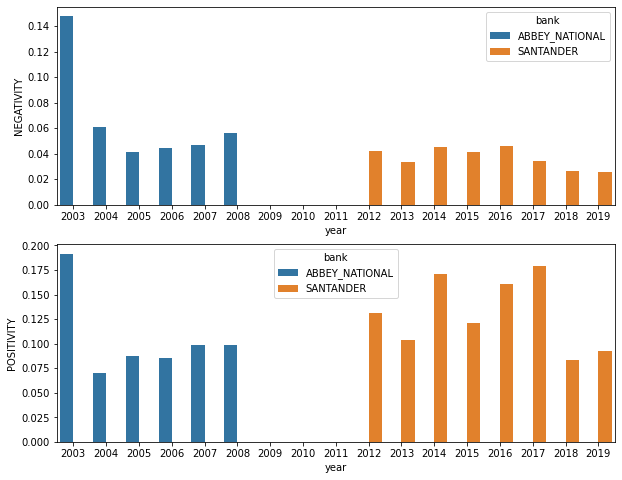

In [16]:
fig, ax = plt.subplots(figsize=(10,8), nrows=2)

df_i_s = df_props_counts[df_props_counts.bank.isin(['SANTANDER', 'ABBEY_NATIONAL'])]
sns.barplot(x='year', y='NEGATIVITY', hue='bank', data=df_i_s, ax=ax[0])
sns.barplot(x='year', y='POSITIVITY', hue='bank', data=df_i_s, ax=ax[1])

Añadir neutralidad:

In [17]:
df_props_counts

,bank,year,IS_NEG,IS_POS,TOTAL,NEGATIVITY,POSITIVITY
0,ABANCA,2014,1,2,2636,0.000379,0.000759
1,ABANCA,2015,1,3,2274,0.000440,0.001319
2,ABANCA,2016,46,149,2482,0.018533,0.060032
3,ABANCA,2017,48,135,5059,0.009488,0.026685
4,ABANCA,2018,50,148,2502,0.019984,0.059153
...,...,...,...,...,...,...,...
149,SANTANDER,2018,316,990,11853,0.026660,0.083523
150,SANTANDER,2019,272,979,10570,0.025733,0.092621
151,WGZ_BANK,2013,97,203,2037,0.047619,0.099656
152,WGZ_BANK,2014,93,219,2170,0.042857,0.100922


In [13]:
data

text  \
bank          year n_page n_phrase                                                      
DEUTSCHE_BANK 2009 82     106           The Group at a Glance \n1 We calculate thi...   
                          132           The Group at a Glance \n1 We calculate thi...   
                          127           The Group at a Glance \n1 We calculate thi...   
                          83            The Group at a Glance \n1 We calculate thi...   
                          142           The Group at a Glance \n1 We calculate thi...   
...                                                                               ...   
BBVA          2017 147    35        REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   
                          30        REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   
                          5         REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   
                          13        REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   
                          21        REPORT PREPARATION \nGUIDELINESP. \n147\n3Conc...   

                                                                               phrase  \
bank          year n_page n_phrase                                                      
DEUTSCHE_BANK 2009 82     106        We calculate this adjusted measure of our ret...   
                          132       eholders equity to make it easier to compare u...   
                          127       adjusted measure as our Pretax return on avera...   
                          83         However this is not a measure of performance ...   
                          142       pare our ratio to other companies ratios witho...   
...                                                                               ...   
BBVA          2017 147    35        nothing has come to our attention that causes ...   
                          30        have not in all material respects been prepare...   
                          5          of the GRI Content Index including the reliab...   
                          13        In accordance with the terms of our engagement...   
                          21         Report and for no other purpose or in any other    

                                    length  negative   neutral  positive  
bank          year n_page n_phrase                                        
DEUTSCHE_BANK 2009 82     106           11  0.000079  0.999602  0.000320  
                          132           12  0.000639  0.853673  0.145688  
                          127           10  0.000098  0.998649  0.001253  
                          83            11  0.000096  0.999862  0.000042  
                          142           16  0.000071  0.999886  0.000043  
...                                    ...       ...       ...       ...  
BBVA          2017 147    35            12  0.000072  0.999716  0.000212  
                          30            14  0.000078  0.999879  0.000043  
                          5             10  0.000061  0.999896  0.000042  
                          13            14  0.000070  0.999888  0.000042  
                          21            10  0.000074  0.999884  0.000043  

[166049 rows x 6 columns]

## Word2Vec

In [84]:
SIZE_VECTORS = 100
WINDOW = 8
EPOCHS = 5
MIN_COUNT = 5

In [82]:
# nlp = spacy.load("en_core_web_sm")

In [83]:
# from pandarallel import pandarallel
# 
# pandarallel.initialize(progress_bar=True, nb_workers=4)

In [19]:
# data['texto_vector'] = data.phrase.progress_apply(lambda x: [w.lemma for w in nlp(x)])
data['texto_vector'] = data.phrase.progress_apply(lambda x: [w.lower() for w in x.split(' ') if w])

100%|████████████████████████████████████████████████████████████████████| 1202495/1202495 [00:06<00:00, 176080.99it/s]


In [27]:
from gensim.models.callbacks import CallbackAny2Vec

class callback_w2v(CallbackAny2Vec):
    '''Callback to print loss after each epoch.'''

    def __init__(self):
        self.epoch = 0

    def on_epoch_end(self, model):
        loss = model.get_latest_training_loss()
        print('Loss after epoch {}: {}'.format(self.epoch, loss))
        self.epoch += 1

In [85]:
w2v = Word2Vec(data.texto_vector, 
               vector_size=SIZE_VECTORS, 
               window=WINDOW, 
               epochs=EPOCHS, 
               min_count=MIN_COUNT, callbacks=[callback_w2v()])

Loss after epoch 0: 0.0
Loss after epoch 1: 0.0
Loss after epoch 2: 0.0
Loss after epoch 3: 0.0
Loss after epoch 4: 0.0


In [86]:
def palabra_en_modelo(palabra):
    try:
        w2v.wv.get_vector(palabra)
        return True
    except:
        return False

def vectorize_text(texto_vector):
    # Complete here the code
    vectors = [w2v.wv.get_vector(i) for i in texto_vector if palabra_en_modelo(i)]

    return np.mean(vectors, axis=0) if len(vectors) else np.empty(SIZE_VECTORS)

In [87]:
vectors = data.texto_vector.progress_apply(lambda x: vectorize_text(x)).to_numpy()

100%|█████████████████████████████████████████████████████████████████████| 1202495/1202495 [01:05<00:00, 18272.31it/s]


In [120]:
dfVectors = pd.DataFrame(np.concatenate(vectors).reshape(vectors.shape[0],SIZE_VECTORS,), index=data.index, 
                         columns=[f'WV{i}' for i in range(SIZE_VECTORS)])

In [121]:
Q1 = dfVectors.quantile(0.25)
Q3 = dfVectors.quantile(0.75)
IQR = Q3 - Q1

In [129]:
dataset = dfVectors[(dfVectors > (Q1 - 3 * IQR)) & (dfVectors < (Q3 + 3 * IQR))].dropna()

In [130]:
dataset

WV0       WV1       WV2       WV3  \
bank           year n_page n_phrase                                           
ABBEY_NATIONAL 2003 1      1        -1.482458  1.096572  0.572964 -0.353693   
                    2      28       -0.033675  0.271117 -0.454331 -0.222585   
                           20        0.293149  0.282124  1.300869 -0.902285   
                           14        1.306238  1.147499  2.752167 -1.272075   
                           15        1.162466 -0.465517  1.425217 -0.945413   
...                                       ...       ...       ...       ...   
UNICREDIT      2021 840    14        0.524884  0.055104  1.539876  0.433819   
                           18        1.179344 -0.061376  1.824394  0.050553   
                    843    1        -0.150413  1.162912  0.612239  0.201966   
                           2         0.404951  0.054793  0.732988  0.266030   
                           3         1.099717 -0.251138  2.649645 -0.286190   

                                          WV4       WV5       WV6       WV7  \
bank           year n_page n_phrase                                           
ABBEY_NATIONAL 2003 1      1        -1.577469  0.910671  0.200104  1.343698   
                    2      28        0.689267  1.207099 -0.109047 -1.260616   
                           20       -0.966573  0.173828 -0.145623 -0.645024   
                           14        1.066645  0.299209  0.104695 -0.558603   
                           15       -0.442012 -0.002988  0.189800 -0.292946   
...                                       ...       ...       ...       ...   
UNICREDIT      2021 840    14       -0.715787  0.016639  0.879400  0.094929   
                           18       -0.765458  0.476969  0.671076  0.489165   
                    843    1         0.135153  0.907962 -0.292064 -0.711804   
                           2        -0.009195  0.401621 -0.146425 -0.042481   
                           3         0.906641  1.064013  0.244022  0.691749   

                                          WV8       WV9  ...      WV90  \
bank           year n_page n_phrase                      ...             
ABBEY_NATIONAL 2003 1      1        -1.297984 -0.495582  ... -1.471037   
                    2      28       -1.490116 -0.135687  ... -1.512503   
                           20       -2.397928  1.334787  ... -1.746290   
                           14       -0.409680  0.906991  ... -0.808731   
                           15        0.138736  2.013260  ... -0.559549   
...                                       ...       ...  ...       ...   
UNICREDIT      2021 840    14       -0.830860 -0.145918  ... -0.993779   
                           18       -0.684694 -0.778863  ... -0.491928   
                    843    1        -1.447795  0.771014  ... -2.242413   
                           2        -0.240937 -0.223607  ...  0.119739   
                           3         0.670841 -0.207246  ... -0.764068   

                                         WV91      WV92      WV93      WV94  \
bank           year n_page n_phrase                                           
ABBEY_NATIONAL 2003 1      1        -0.201264 -1.094750 -0.649391 -1.256316   
                    2      28       -0.923626  0.289392 -1.205892 -2.075199   
                           20       -0.274317 -0.662529 -2.384121  0.131600   
                           14       -0.239082 -0.816157 -1.229467 -0.942578   
                           15        0.265190 -1.077219 -0.567937 -0.615293   
...                                       ...       ...       ...       ...   
UNICREDIT      2021 840    14       -0.963237  0.603169 -0.599335  0.939726   
                           18       -0.607122  0.217639  0.005957  0.885242   
                    843    1        -0.210147  1.413594 -1.160063 -1.161397   
                           2         0.065711  0.420722  0.275285  0.148782   
                           3         0.804694  0.507748 -0.320319 -0.559559

In [131]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [144]:
model = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('cluster', KMeans(n_clusters=5))
])
cluster = model.fit_predict(dataset)

In [145]:
pd.Series(cluster).value_counts()

3    360916
4    249909
2    225491
1    222869
0     90741
dtype: int64

In [152]:
dataset['cluster'] = cluster

### Model Checkpoints

In [174]:
w2v.save(path_modelo_w2v)
dump(model, path_modelo_clustering)

['../Data/MODELS/clustering_pipeline.joblib']

In [159]:
dataset_small = dataset.sample(40000)
cluster_small = dataset_small.pop('cluster')

X_embedded = TSNE(n_components=2, 
                  learning_rate='auto', 
                  init='pca', verbose=1,
                  #n_iter=10000
                 ).fit_transform(dataset_small)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 40000 samples in 0.000s...
[t-SNE] Computed neighbors for 40000 samples in 22.441s...
[t-SNE] Computed conditional probabilities for sample 1000 / 40000
[t-SNE] Computed conditional probabilities for sample 2000 / 40000
[t-SNE] Computed conditional probabilities for sample 3000 / 40000
[t-SNE] Computed conditional probabilities for sample 4000 / 40000
[t-SNE] Computed conditional probabilities for sample 5000 / 40000
[t-SNE] Computed conditional probabilities for sample 6000 / 40000
[t-SNE] Computed conditional probabilities for sample 7000 / 40000
[t-SNE] Computed conditional probabilities for sample 8000 / 40000
[t-SNE] Computed conditional probabilities for sample 9000 / 40000
[t-SNE] Computed conditional probabilities for sample 10000 / 40000
[t-SNE] Computed conditional probabilities for sample 11000 / 40000
[t-SNE] Computed conditional probabilities for sample 12000 / 40000
[t-SNE] Computed conditional probabilities for sa

C:\Users\juans\miniconda3\envs\nlp-3-8\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 106.748047
[t-SNE] KL divergence after 1000 iterations: 3.546391


In [160]:
X_embedded_df = pd.DataFrame(X_embedded, columns=['C1','C2'], index=dataset_small.index).reset_index()
X_embedded_df['cluster'] = cluster_small.to_numpy()

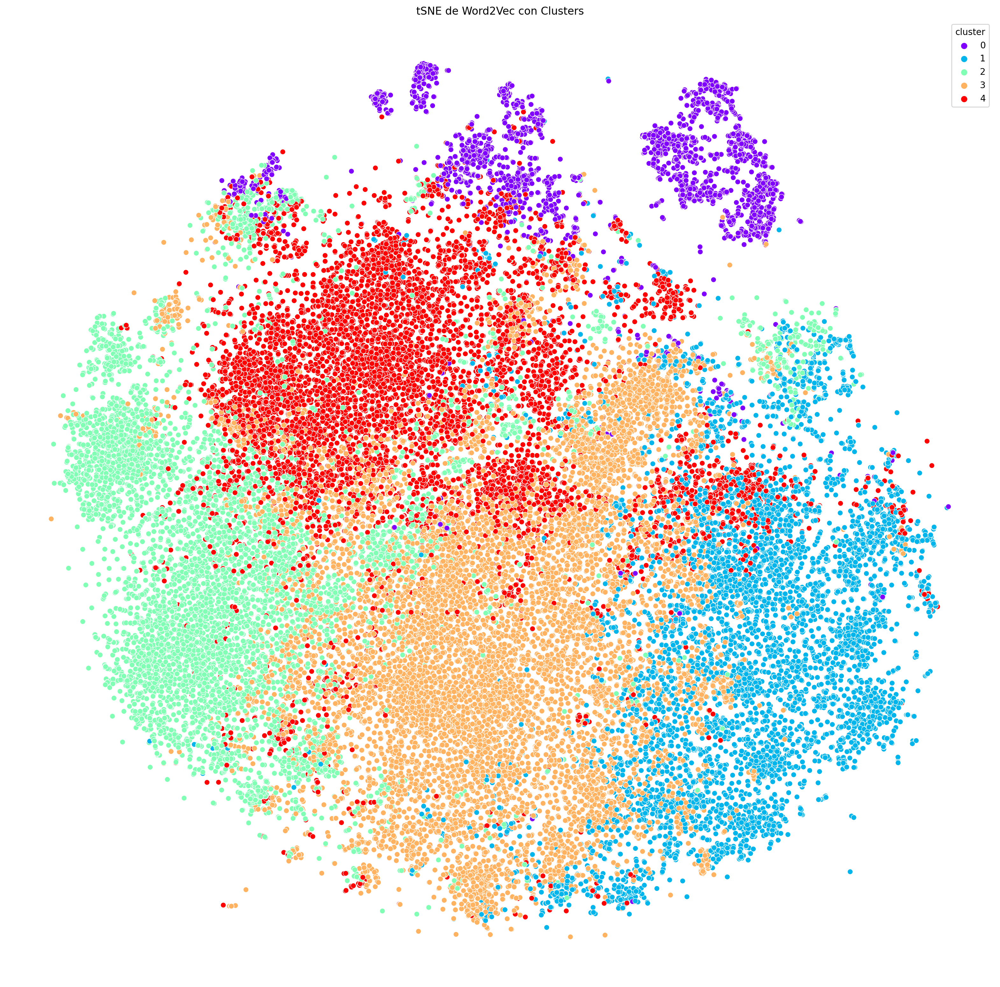

In [170]:
fig, ax = plt.subplots(figsize=(20,20), dpi=200)
sns.scatterplot(data=X_embedded_df, x='C1', y='C2', hue='cluster', palette='rainbow', ax=ax)
ax.set_title('tSNE de Word2Vec con Clusters')
ax.axis('off')
plt.show()

In [182]:
X_embedded_df = pd.DataFrame(X_embedded, columns=['C1','C2'], index=sentiment_phrases.index).join(data[['negative','positive']])

In [183]:
X_embedded_df['sentiment'] = 0
X_embedded_df['sentiment'] = X_embedded_df['sentiment'] + X_embedded_df['positive'] - X_embedded_df['negative']

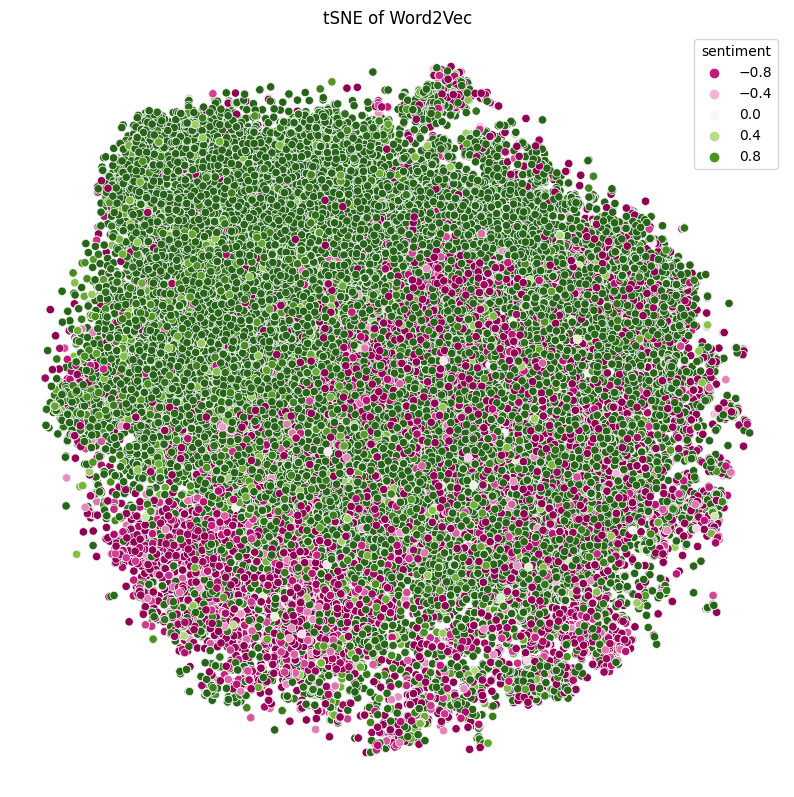

In [185]:
fig, ax = plt.subplots(figsize=(10,10), dpi=100)
sns.scatterplot(data=X_embedded_df, x='C1', y='C2', hue='sentiment', palette='PiYG', ax=ax)
ax.set_title('tSNE of Word2Vec')
ax.axis('off')
plt.show()

In [200]:
pca = PCA(n_components=4)

df_pca = pd.DataFrame(pca.fit_transform(sentiment_phrases), columns=['PC1','PC2','PC3','PC4'], index=sentiment_phrases.index).reset_index()

In [201]:
df_pca

,bank,year,n_page,n_phrase,PC1,PC2,PC3,PC4
0,ABANCA,2014,61,16,-0.013787,0.041881,0.013231,0.058963
1,ABANCA,2014,81,40,-0.008343,0.026534,0.028587,0.060595
2,ABANCA,2014,170,21,-0.012114,0.038851,0.009702,0.069137
3,ABANCA,2015,22,29,-0.014338,0.044487,0.014223,0.059254
4,ABANCA,2015,43,8,0.005760,0.034102,-0.005727,0.043359
...,...,...,...,...,...,...,...,...
63359,WGZ_BANK,2015,262,12,0.003685,-0.042626,0.027228,0.018023
63360,WGZ_BANK,2015,262,43,0.022454,-0.009579,0.028543,-0.024094
63361,WGZ_BANK,2015,264,6,0.003695,-0.011702,0.024804,0.005410
63362,WGZ_BANK,2015,264,8,-0.012579,-0.010126,0.010786,0.049784


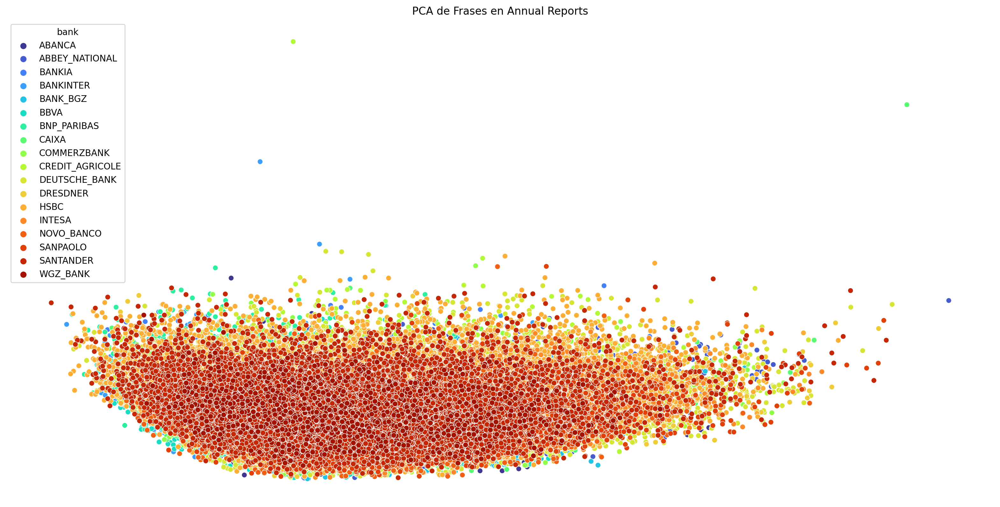

In [202]:
fig, ax = plt.subplots(figsize=(20,10), ncols=1, dpi=200)
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='bank', palette='turbo', alpha=1, ax=ax)
#sns.scatterplot(data=df_pca, x='PC2', y='PC3', hue='bank', ax=ax[1])
ax.set_title('PCA de Frases en Annual Reports')
#ax[1].set_title('PCA de Frases en Annual Reports')
ax.axis('off')
#ax[1].axis('off')
plt.show()

In [204]:
df_pca_sentiment = pd.DataFrame(pca.transform(sentiment_phrases), 
                                columns=['PC1','PC2','PC3','PC4'], 
                                index=sentiment_phrases.index).join(data[['negative','positive']])

In [205]:
df_pca_sentiment['sentiment'] = 0
df_pca_sentiment['sentiment'] = df_pca_sentiment['sentiment'] + df_pca_sentiment['positive'] - df_pca_sentiment['negative']

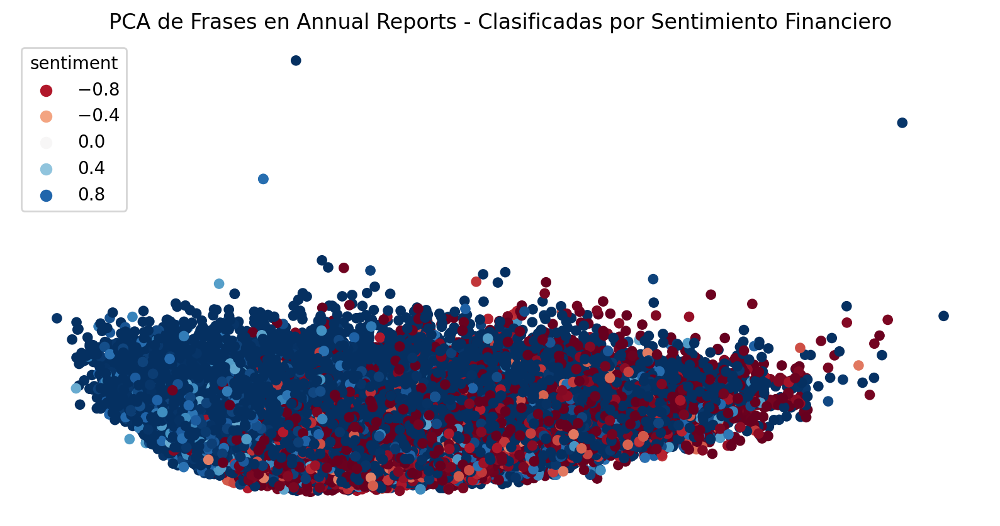

In [206]:
fig, ax = plt.subplots(figsize=(10,5), ncols=1, dpi=200)
sns.scatterplot(data=df_pca_sentiment[(df_pca_sentiment.sentiment >= .5) | (df_pca_sentiment.sentiment <= -.5)], 
                x='PC1', y='PC2', hue='sentiment', palette='RdBu', linewidth=0, alpha=1, ax=ax)
#sns.scatterplot(data=df_pca, x='PC2', y='PC3', hue='bank', ax=ax[1])
ax.set_title('PCA de Frases en Annual Reports - Clasificadas por Sentimiento Financiero')
#ax[1].set_title('PCA de Frases en Annual Reports')
ax.axis('off')
#ax[1].axis('off')
plt.show()

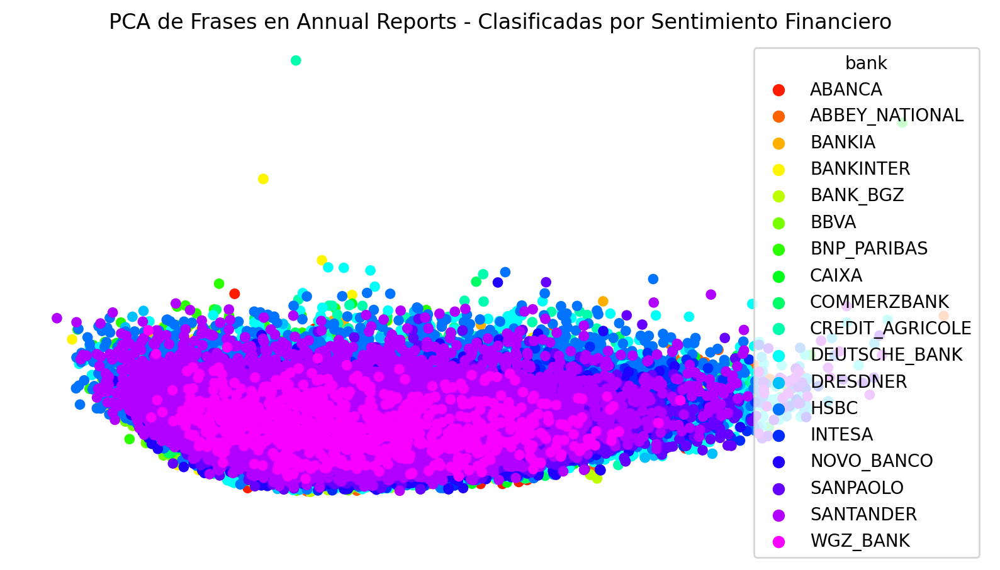

In [207]:
fig, ax = plt.subplots(figsize=(10,5), ncols=1, dpi=200)
sns.scatterplot(data=df_pca_sentiment[(df_pca_sentiment.sentiment >= .5) | (df_pca_sentiment.sentiment <= -.5)], 
                x='PC1', y='PC2', hue='bank', palette='gist_rainbow', linewidth=0, alpha=1, ax=ax)
#sns.scatterplot(data=df_pca, x='PC2', y='PC3', hue='bank', ax=ax[1])
ax.set_title('PCA de Frases en Annual Reports - Clasificadas por Sentimiento Financiero')
#ax[1].set_title('PCA de Frases en Annual Reports')
ax.axis('off')
#ax[1].axis('off')
plt.show()

In [208]:
df_pca_sentiment[(df_pca_sentiment.sentiment >= .4) | (df_pca_sentiment.sentiment <= -.4)]

PC1       PC2       PC3       PC4  \
bank     year n_page n_phrase                                           
ABANCA   2014 61     16       -0.013787  0.041881  0.013228  0.058944   
              81     40       -0.008343  0.026533  0.028584  0.060580   
              170    21       -0.012114  0.038851  0.009699  0.069118   
         2015 22     29       -0.014338  0.044487  0.014219  0.059233   
              43     8         0.005760  0.034102 -0.005729  0.043344   
...                                 ...       ...       ...       ...   
WGZ_BANK 2015 262    12        0.003685 -0.042626  0.027230  0.018024   
                     43        0.022454 -0.009579  0.028544 -0.024101   
              264    6         0.003695 -0.011702  0.024803  0.005400   
                     8        -0.012579 -0.010125  0.010789  0.049780   
              274    29        0.066421 -0.010167  0.064254 -0.012754   

                               negative  positive  sentiment  
bank     year n_page n_phrase                                 
ABANCA   2014 61     16        0.001180  0.826349   0.825169  
              81     40        0.959789  0.000756  -0.959033  
              170    21        0.000926  0.995606   0.994681  
         2015 22     29        0.000594  0.971773   0.971179  
              43     8         0.561060  0.003696  -0.557364  
...                                 ...       ...        ...  
WGZ_BANK 2015 262    12        0.000430  0.996309   0.995878  
                     43        0.903546  0.095970  -0.807576  
              264    6         0.000469  0.877470   0.877001  
                     8         0.001562  0.812694   0.811132  
              274    29        0.960591  0.000639  -0.959952  

[63471 rows x 7 columns]

In [168]:
# w2v.wv.most_similar('equity', topn=20)

In [209]:
nlp('acquisitions')[0].lemma_

'acquisition'

In [169]:
# w2v.wv.index_to_key